## Question 1

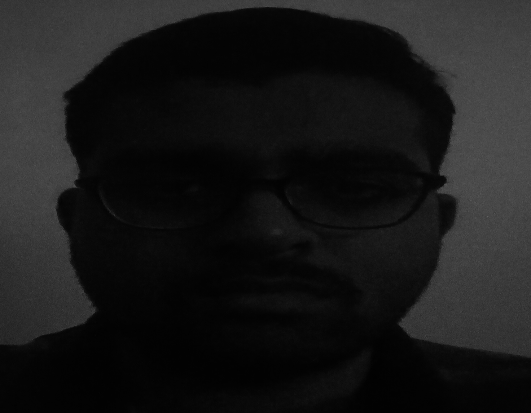

In [359]:
'''
Question 1) Enhancing the night time image by noise removal and manipulating the histogram
'''
from google.colab.patches import cv2_imshow # cv2.imshow() is disabled by colab hence this needs to be imported to display images
import cv2
import numpy as np
from matplotlib import pyplot as plt # used to plot the histogram
nightShot = cv2.imread("night_shot.jpg"); # loads the night shot image
nightShot = cv2.resize(nightShot, (531,413)); # resize the night_shot image such that it does not occupies a large area
nightShot_gray = cv2.cvtColor(nightShot,cv2.COLOR_BGR2GRAY);  # Converts nightShot image into grayscale image
cv2_imshow(nightShot_gray); # display the grayscale nightshot image

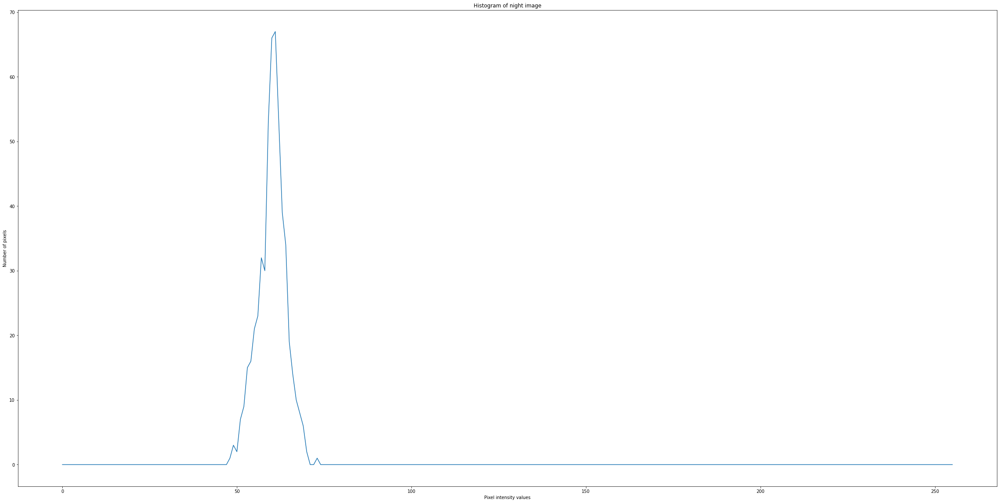

In [360]:
# Plot the histogram of the night time image
histr = cv2.calcHist(nightShot_gray,[0],None,[256],[0,255]); # Calculates the histogram of the grayscale nightshot image
plt.figure(figsize = (40,20)); # alter the size of histogram to be displayed
plt.title('Histogram of night image');
plt.xlabel('Pixel intensity values');
plt.ylabel('Number of pixels');
display(plt.plot(histr)); # Display the histogram plot

**Question 1)** From the histogram of the image we can see that most of the pixel intensities are in the range of 40-70. Thus the image is dark in appearence.

**Reference:** Digital Image Processing, Gonzalez and Woods 3rd Edition, page no:170, 171.

**Observations:**

1) In this image different edges are not visible clearly so we can apply image sharpening so that different regions of this image are visible clearly.

2) First we will compute the Laplacian of the grayscale image and add the laplacian to original image. Laplacian highlights intensity discontinuity in an image and de-emphasises the regions with slowly varying intensity levels.

3) Then compute Sobel of original image and apply smoothening to sobel of image to remove noise. Sobel operator finds out the directional edges in an image and sharp changes in intensities. The output image highlights these edges. 

4) Then we can create a mask image formed by product of sobel smoothened image and laplacian added original image.

5) The output obtained after following these steps is the night time image with enhanced features.

This is the Laplacian ouput which detects presence of sharp edges in the image: 


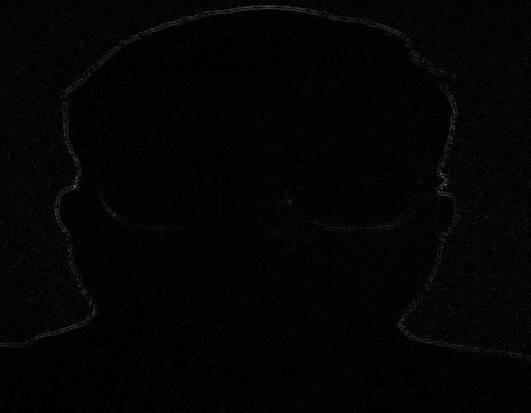

This is the original grayscale nightshot image:


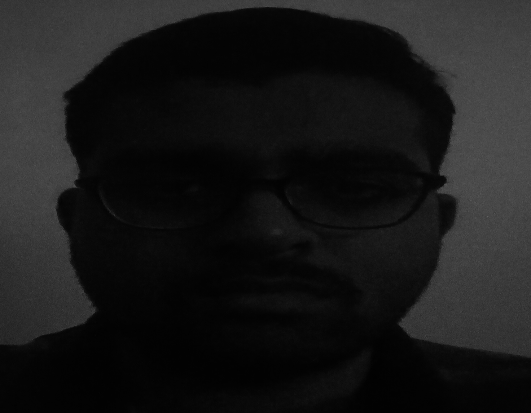

This is the Laplacian ouput image added to the original nightshot grayscale image: 


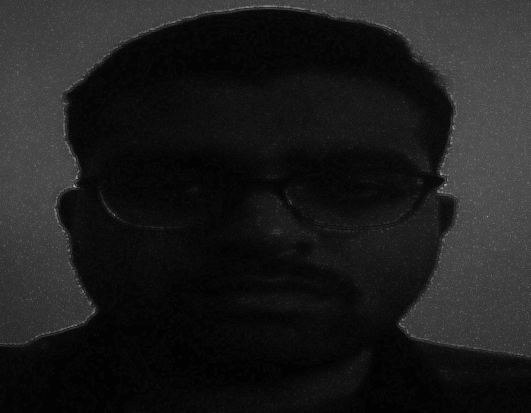

If we directly apply laplacian to unblurred image: 


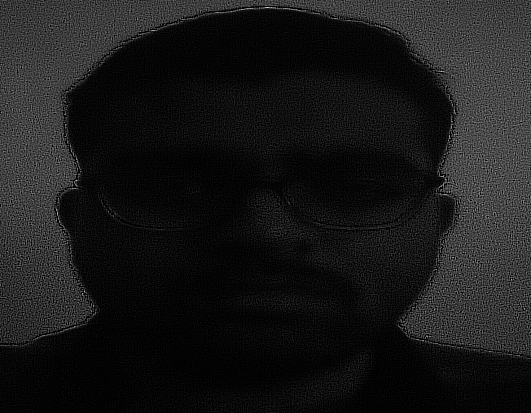

In [361]:
# FIND THE LAPLACIAN OF NIGHT IMAGE
# Reference: https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html

nightShotBlurred = cv2.GaussianBlur(nightShot_gray, (3, 3), 0); # Remove noise by blurring with a Gaussian filter
ddepth = cv2.CV_16S;  # Depth of the destination image. Since our input is CV_8U we define ddepth = CV_16S to avoid overflow
kernel_size = 3; # The kernel size of the Sobel operator to be applied internally. We use 3 in this example.
laplacian_out = cv2.Laplacian(nightShotBlurred, ddepth, ksize=kernel_size);  # Apply Laplace function
laplacian_out = cv2.convertScaleAbs(laplacian_out); # converting back to uint8
print("This is the Laplacian ouput which detects presence of sharp edges in the image: ");
cv2_imshow(laplacian_out); # display the laplacian output image

LaplacianPlusOriginal = np.zeros(np.size(nightShot_gray), dtype=np.uint16) # converting to uint16 to prevent overflow
laplacianPlusOriginal = laplacian_out + nightShot_gray; # adding the laplacian operated image to night time original image
laplacianPlusOriginal = cv2.convertScaleAbs(laplacianPlusOriginal); # converting back to uint8
print("This is the original grayscale nightshot image:");
cv2_imshow(nightShot_gray);
print("This is the Laplacian ouput image added to the original nightshot grayscale image: ");
cv2_imshow(laplacianPlusOriginal);  # display the laplacian edges detected added with original image
print("If we directly apply laplacian to unblurred image: ");
laplacianWithoutBlur = cv2.Laplacian(nightShot_gray, ddepth, ksize=kernel_size);  # Apply Laplace function
cv2_imshow(laplacianWithoutBlur + nightShot_gray); # Shows the effect of applying laplacian on original image directly without blurring

**Observations:**

1) After applying laplacian operator to the original image, it detects the edges and we can observe that the appearence is slightly improved over the original nighttime grayscale image.

2) Blurring is essential initially else the laplacian produces a noisy image and may lead to visually degraded image.

3) Keeping the window size = 5 resulted in very bad resulting image in which too many ghost edges were introduced.

Below image is the output after applying sobel operator in X direction: 


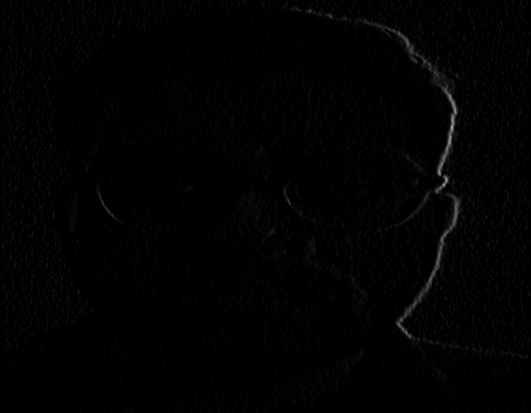

Below image is the output after applying sobel operator in Y direction: 


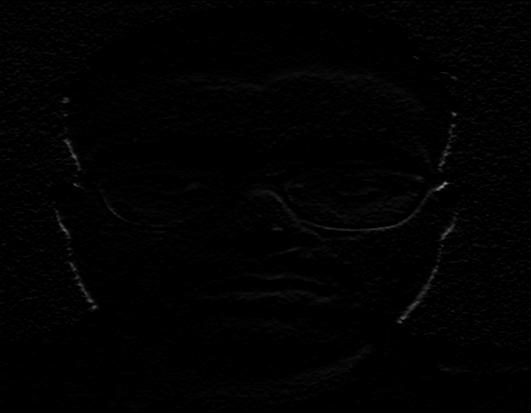

The below image is combined image of Sobel operator in X and Y direction: 


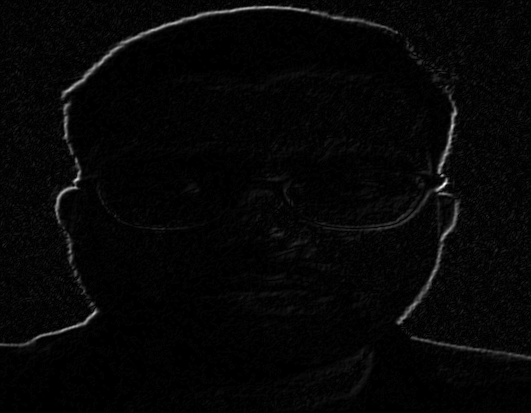

The below image is addition of Sobel operator in X and Y direction with original grayscale image: 


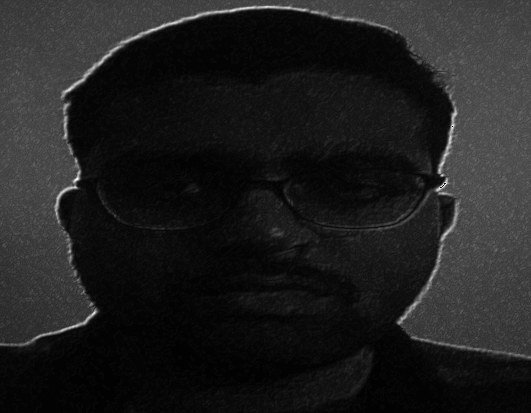

In [362]:
# APPLY SOBEL ON ORIGINAL IMAGE

# Reference: https://www.geeksforgeeks.org/python-program-to-detect-the-edges-of-an-image-using-opencv-sobel-edge-detection/ 
# https://docs.opencv.org/3.4/d2/d2c/tutorial_sobel_derivatives.html

# Calculation of Sobelx
sobel_X = cv2.Sobel(nightShotBlurred,ddepth,1,0,ksize=3); # Apply sobel operator in X dierction
print("Below image is the output after applying sobel operator in X direction: ");
cv2_imshow(sobel_X);

sobel_Y = cv2.Sobel(nightShotBlurred,ddepth,0,1,ksize=3); # Apply Sobel operator in Y direction
print("Below image is the output after applying sobel operator in Y direction: ");
cv2_imshow(sobel_Y);

Sobel_X_Y = np.zeros(np.size(nightShot_gray),dtype = np.uint16);  # create an empty image to store addition of SobelX and SobelY images
Sobel_X_Y = sobel_X + sobel_Y;  # Adding both sobel operator output images
Sobel_X_Y = cv2.convertScaleAbs(Sobel_X_Y); # converting back to uint8
print("The below image is combined image of Sobel operator in X and Y direction: ");
cv2_imshow(Sobel_X_Y);  # display sobel combined X and Y image
Sobel_X_YplusOriginal = np.zeros(np.size(nightShot_gray),dtype = np.uint16);
Sobel_X_YplusOriginal = Sobel_X_Y + nightShot_gray;
Sobel_X_YplusOriginal = cv2.convertScaleAbs(Sobel_X_YplusOriginal);
print("The below image is addition of Sobel operator in X and Y direction with original grayscale image: ");
cv2_imshow(Sobel_X_YplusOriginal); 

Blurred image obtained after blurring the combined image formed after adding sobel image with original nightshot grayscale image:


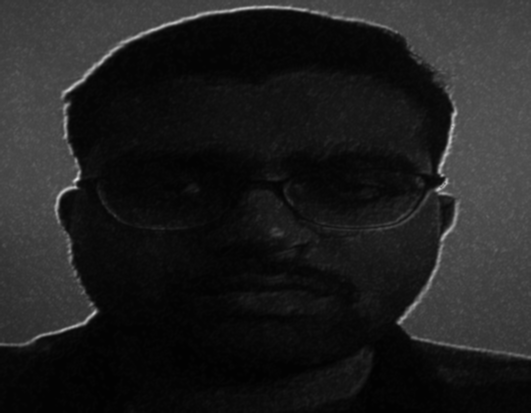

Output mask formed after multiplying sobel image with laplacian output image:


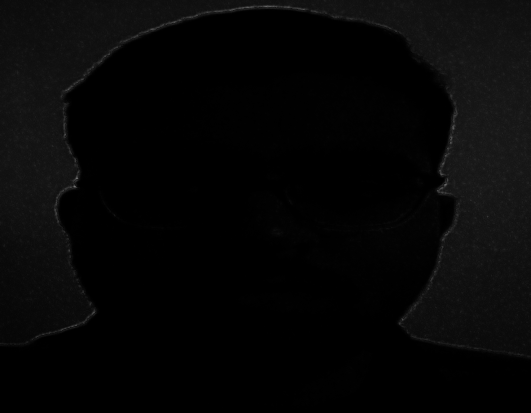

Adding above mask to the original image: 


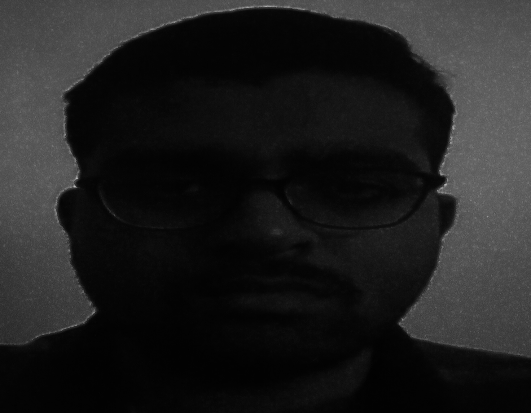

Original nightshot image:


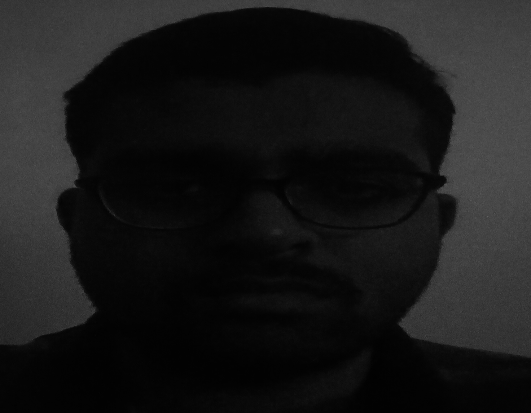

In [363]:
# SMOOTHEN THE SOBEL IMAGE WITH GAUSSIAN FILTER
Sobel_X_YplusOriginal_blurred = cv2.GaussianBlur(Sobel_X_YplusOriginal, (3, 3), 0);
print("Blurred image obtained after blurring the combined image formed after adding sobel image with original nightshot grayscale image:");
cv2_imshow(Sobel_X_YplusOriginal_blurred);

# Form a mask by multiplying Sobel_X_YplusOriginal_blurred and (Laplacian combined with original image)
#mask = np.zeros(np.size(nightShot_gray),np.uint32); # to avoid overflow
mask = (Sobel_X_YplusOriginal_blurred/255)*(laplacianPlusOriginal/255); # Downscaling by 255 to avoid the overflow
mask = mask*255;
print("Output mask formed after multiplying sobel image with laplacian output image:");
cv2_imshow(mask);
mask_plus_original = np.zeros(np.size(nightShot_gray),np.uint32);
mask_plus_original = mask + nightShot_gray;
mask_plus_original = cv2.convertScaleAbs(mask_plus_original);
print("Adding above mask to the original image: ");
cv2_imshow(mask_plus_original);
print("Original nightshot image:");
cv2_imshow(nightShot_gray);

Gamma = 0.1


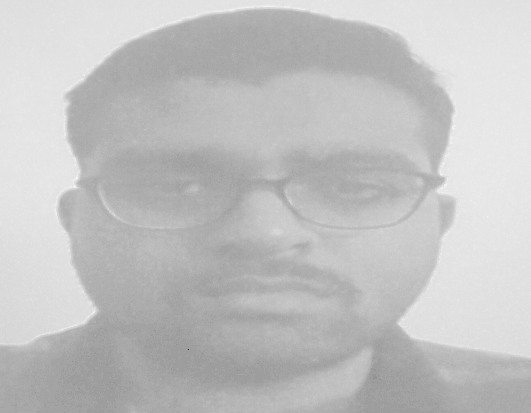

Gamma = 0.2


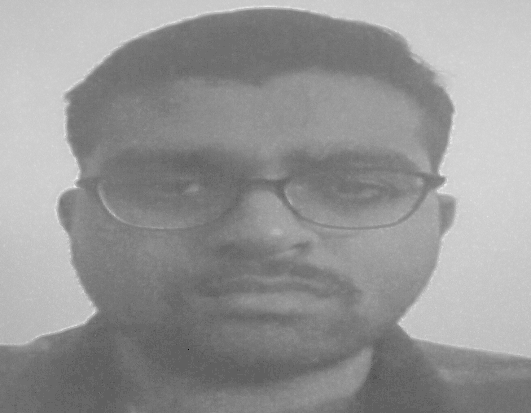

Gamma = 0.30000000000000004


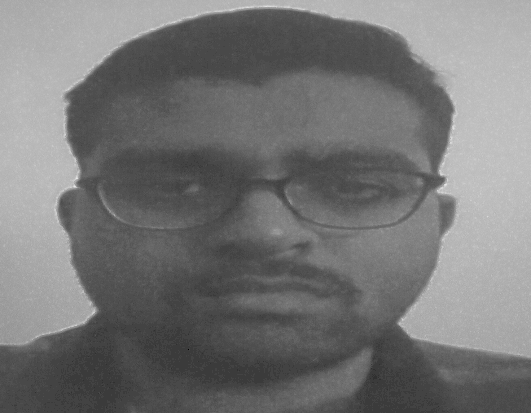

Gamma = 0.4


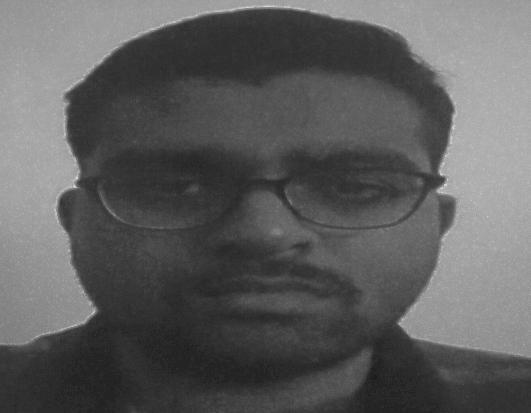

Gamma = 0.5


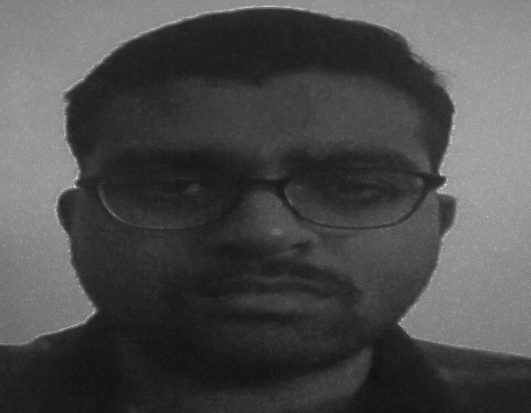

Gamma = 0.6


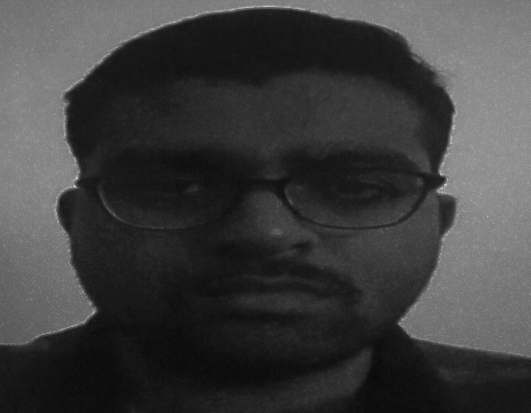

Gamma = 0.7


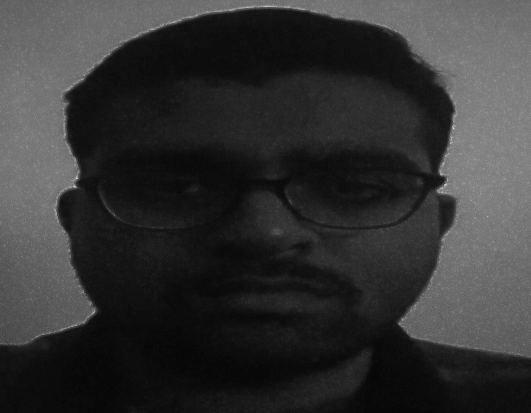

Gamma = 0.7999999999999999


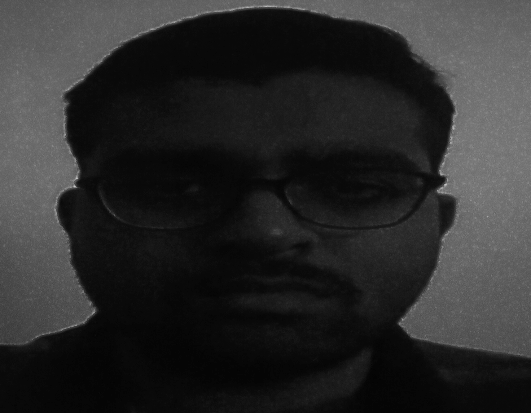

Gamma = 0.8999999999999999


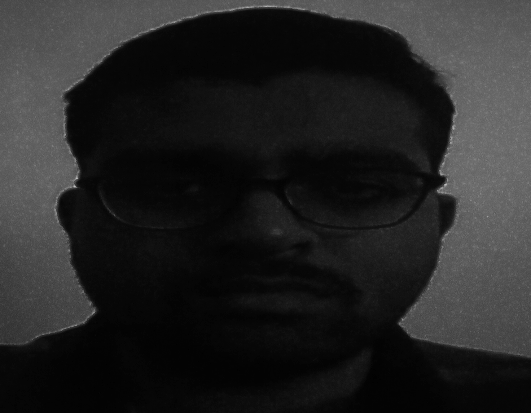

Gamma = 0.9999999999999999


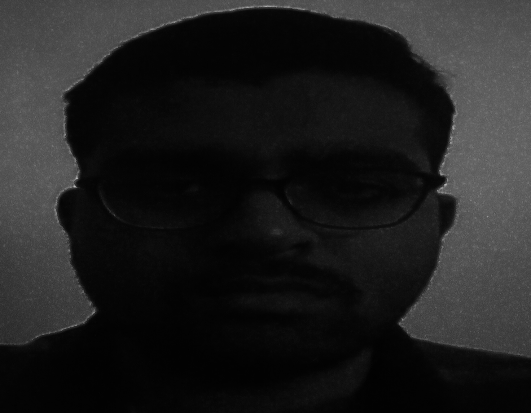

In [364]:
# MANIPULATING THE IMAGE HISTOGRAM FOR IMAGE ENHANCEMENT BY USING GAMMA CORRECTOIN
# Reference: 213070003_A01.ipynb (my assignment 1)

gamma = 0.1;  # start with gamm = 0.1
while gamma<1.0:  # Stop the loop when gamma = 1
   print("Gamma = " + str(gamma));
   gamma_corrected = np.array(255*(mask_plus_original/255) ** gamma, dtype = 'uint8'); # Use down scaling in order to preserve the dynamic range of image
   cv2_imshow(gamma_corrected); # display the image
   gamma += 0.1;  # increment gamm in steps of 0.1

**OBSERVATIONS:**

1) original grayscale night shot image was added with the mask image (sobel image*(laplacian image+original image)) and gamma correction was applied to alter the image histogram.

2) After tru=ying several combinations of gamma, I observed that gamma = 0.7 value makes certain details visible while maintaining the night shot nature of the image.

3) So the final enhanced nightshot image looks as given in the output of below code cell.


Final enhanced image after applying Laplacian + Sobel edge detection and Gamma correction by gamma = 0.7:


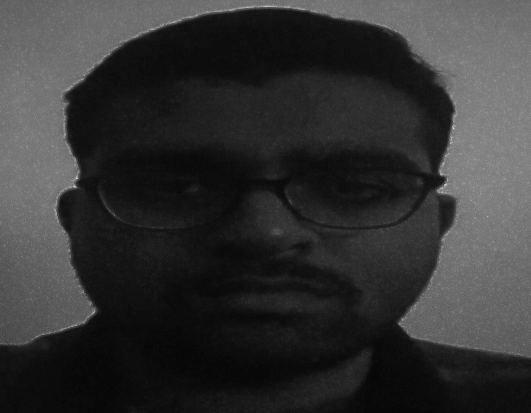

Original grayscale nightshot image:


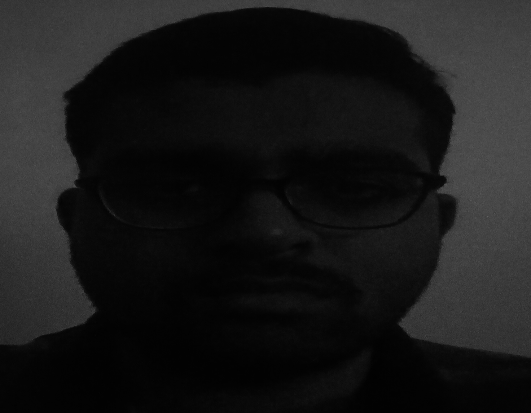

In [365]:
gamma_corrected = np.array(255*(mask_plus_original/255) ** 0.7, dtype = 'uint8'); # Use down scaling in order to preserve the dynamic range of image
print("Final enhanced image after applying Laplacian + Sobel edge detection and Gamma correction by gamma = 0.7:");
cv2_imshow(gamma_corrected); # display the image
print("Original grayscale nightshot image:");
cv2_imshow(nightShot_gray); # display the image

**Observation:**

1) Both the original and enhanced nightshot images are shown above. I applied Sobel and Laplacian mask for image sharpening. Also to modify the image histogram and make certaing features visible, I Gamma correction by a factor of 0.7.

2) gamma = 0.7 was used mainly because it retains the night character of the input image and also makes many features visible like eyes, nose, frame boundry of spectacles etc. which were earlier absent in the original image.

3) Other values of gamma less than 0.7 will make the image brighter and it will not appear as a night shot.

4) Values of gamma greater than 0.7 will make the image darker and we loose the features visible in the enhanced sharpened image.

## Question 2 ##

Original image


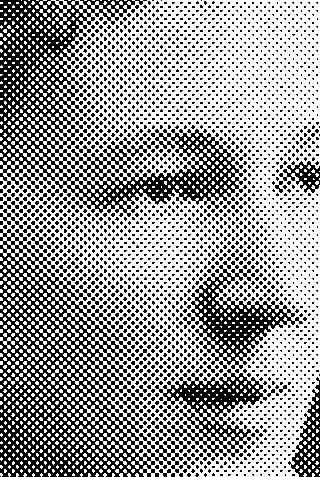

Grayscale Moire Image


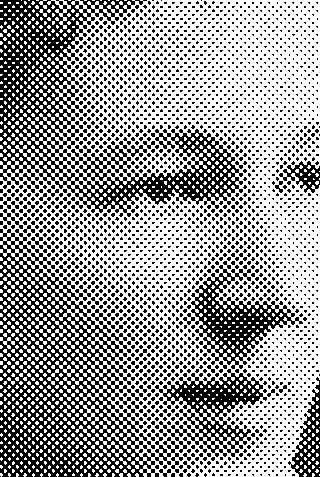

In [366]:
# DISPLAY THE IMAGE CORRUTED DUE TO MOIRE PATTERNS
moireImage = cv2.imread("newspaper-dots.jpg"); # loads the newspaper-dots image
moireImage_gray = cv2.cvtColor(moireImage,cv2.COLOR_BGR2GRAY);  # Converts image into grayscale image
print("Original image");
cv2_imshow(moireImage); # display the image
print("Grayscale Moire Image");
cv2_imshow(moireImage_gray); # display the grayscale image

**Observations:**

1) The above image is corrupted due to dots and this effect is called as a Moire effect which frequently occurs in newspapers.

2) We can see the DFT magnitude spectrum of the image and apply a notch filter to remove the effect of these patterns.

3) This effect occurs because aliasing occurs when the image is sampled at a lesser dpi value than what is needed.

Magnitude Spectrum of newspaper-dots image: 


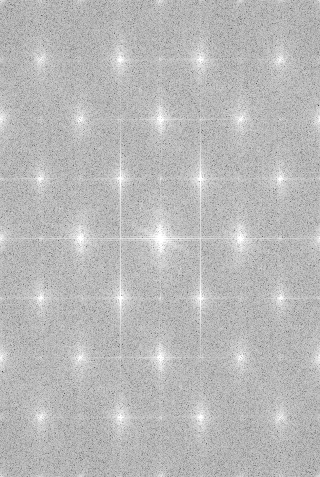

In [367]:
# Finding the DFT magnitude spectrum for given image
# Reference: Fourier transform using opencv in https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html

from matplotlib import pyplot as plt

dft = cv2.dft(np.float32(moireImage_gray),flags = cv2.DFT_COMPLEX_OUTPUT);  # Performs a forward or inverse Discrete Fourier transform of a 1D or 2D floating-point array. 
# https://docs.opencv.org/3.4/d2/de8/group__core__array.html#gadd6cf9baf2b8b704a11b5f04aaf4f39d
dft_shift = np.fft.fftshift(dft); # Shift the zero-frequency component to the center of the spectrum. https://numpy.org/doc/stable/reference/generated/numpy.fft.fftshift.html 
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0],dft_shift[:,:,1])); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print("Magnitude Spectrum of newspaper-dots image: ");
cv2_imshow(magnitude_spectrum); # Display the magnitude spectrum

**Observations:**

We can see that the magnitude spectrum has impulse like bursts and these are a result of near periodicity of Moire patterns. If we attenuate these bursts in frequency domain by notch filtering then we can get a clean image by obtaining IDFT of cleaned spectrum.

In [368]:
# Reference: https://stackoverflow.com/questions/65483030/notch-reject-filtering-in-python
def notch_reject_filter(shape, d0=9, u_k=0, v_k=0):
    P, Q = shape  # Shape of input image
    # Initialize filter with zeros
    H = np.zeros((P, Q))  

    # Traverse through filter
    for u in range(0, P): 
        for v in range(0, Q):
            # Get euclidean distance from point D(u,v) to the center
            D_uv = np.sqrt((u - P / 2 + u_k) ** 2 + (v - Q / 2 + v_k) ** 2)
            D_muv = np.sqrt((u - P / 2 - u_k) ** 2 + (v - Q / 2 - v_k) ** 2)

            if D_uv <= d0 or D_muv <= d0:
                H[u, v] = 0.0 # creates a black circle around the (u_k,v_k) point upto d0 distance from center
            else:
                H[u, v] = 1.0 # for points farther away than d0 keep them unchanged
    return H

original Image


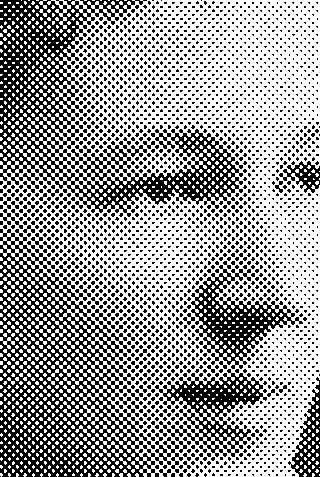

magnitude spectrum


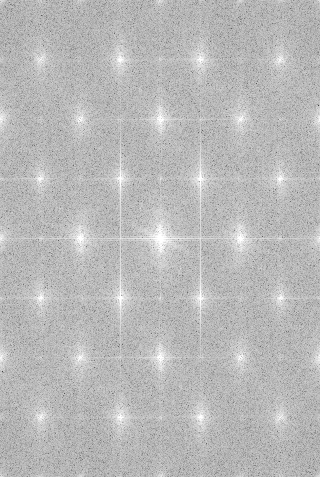

Notch Reject Filter


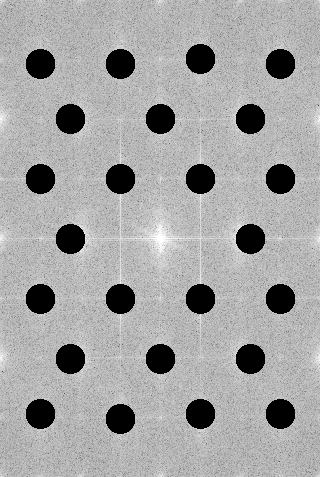

Result


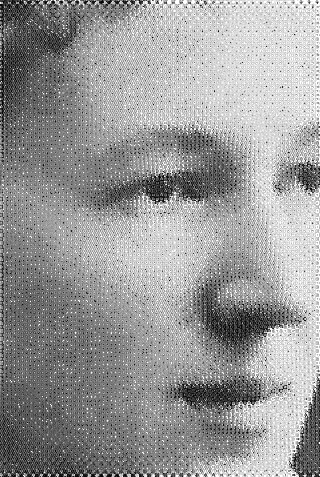

Blurred result to remove noise:


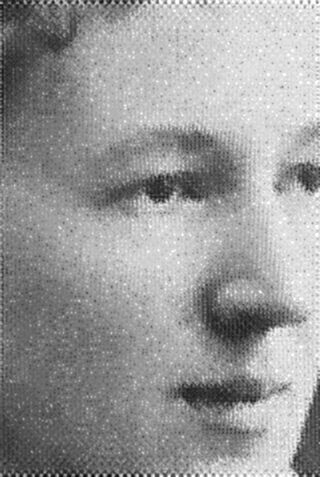

In [369]:
# Reference: https://stackoverflow.com/questions/65483030/notch-reject-filtering-in-python
# https://numpy.org/doc/stable/reference/generated/numpy.fft.ifftshift.html 

img = cv2.imread('newspaper-dots.jpg', 0) # read the newspaper-dot image
f = np.fft.fft2(img);  # Find the 2D FFT of image
fshift = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum = 20*np.log(np.abs(fshift)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 

img_shape = img.shape # returns the dimensions of image

# The following filters were defined to cover different impulse bursts as seen in the magnitude spectrum
# I manually found out the coordinates of the impulse bursts by finding out the values of coordinates from the magnitude spectrum image
# Each of them covers two impulses in the frequency spectrum due to conjugate symmetry of the spectrum
H1 = notch_reject_filter(img_shape, 15, 60, 40);
H2 = notch_reject_filter(img_shape, 15, -60, 40);
H3 = notch_reject_filter(img_shape, 15, -180, 40);
H4 = notch_reject_filter(img_shape, 15, 175, 40);
H5 = notch_reject_filter(img_shape, 15, 175, 120);
H6 = notch_reject_filter(img_shape, 15, 175, -120);
H7 = notch_reject_filter(img_shape, 15, 60, 120);
H8 = notch_reject_filter(img_shape, 15, -60, 120);
H9 = notch_reject_filter(img_shape, 15, 0, 90);
H10 = notch_reject_filter(img_shape, 15, 120, 0);
H11 = notch_reject_filter(img_shape, 15, 120, 90);
H12 = notch_reject_filter(img_shape, 15, -120, 90);

NotchFilter = H1*H2*H3*H4*H5*H6*H7*H8*H9*H10*H11*H12; # overall notch filter will be product of all above filters
NotchRejectCenter = fshift * NotchFilter # Desired Notch reject filter
NotchReject = np.fft.ifftshift(NotchRejectCenter) # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
inverse_NotchReject = np.fft.ifft2(NotchReject)  # Compute the inverse DFT of the result

Result = np.abs(inverse_NotchReject)  # converts the intensity values into positive values

print('original Image');
cv2_imshow(img);

print('magnitude spectrum');
cv2_imshow(magnitude_spectrum);

print('Notch Reject Filter');
cv2_imshow(magnitude_spectrum*NotchFilter);

print('Result');
cv2_imshow(Result);

blurredNewsPaperImg = cv2.GaussianBlur(Result, (3, 3), 0); # Remove noise by blurring with a Gaussian filter
print('Blurred result to remove noise:')
cv2_imshow(blurredNewsPaperImg);

**Observations:**

1) In order to remove the newspaper ink dot effect we need a notch filter which will remove the impulse bursts present in the magnitude spectrum of the image.

2) We remove these impulse bursts in frequency domain and obtain the filtered image by applying the IFFT to the cleaned frequency spectrum. This is shown in one of the figures in above code cell.

3) Desired result still has noise which can be removed by smoothening the image by using a gaussian blurring filter.

4) The final (last image in above code cell) looks more natural over input image and is a significant improvement over it. We have successfully removed ink dot effect in the final output.

##Question 3##

(551, 680, 3)
Red channel of image


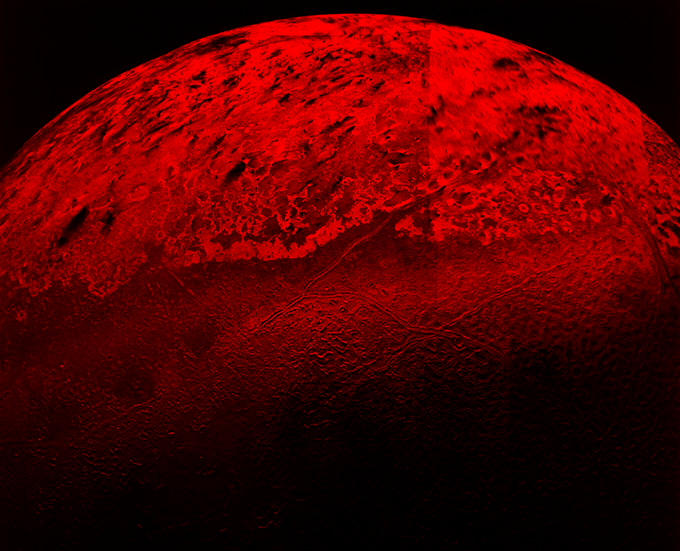

Green channel of image


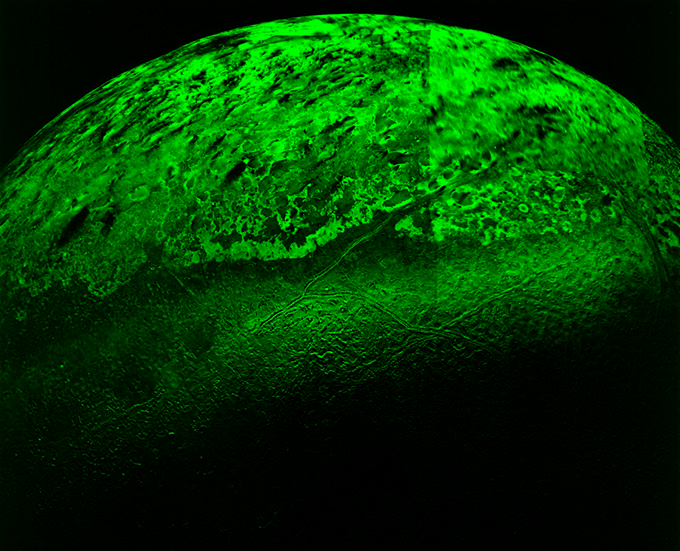

Blue channel of image


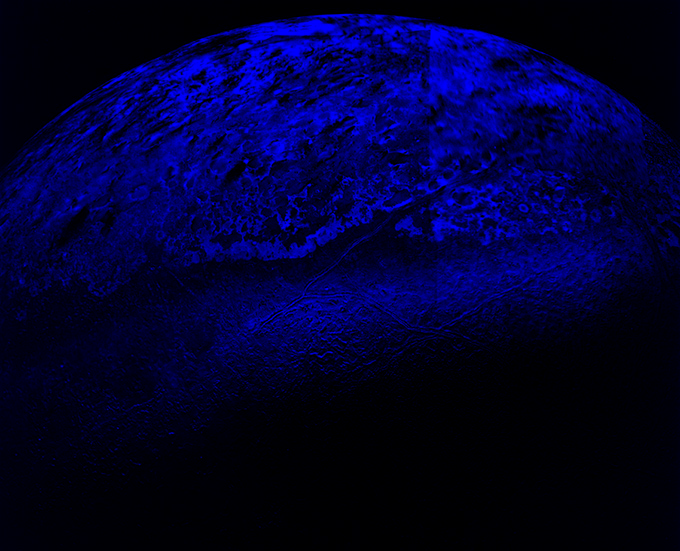

In [370]:
triton = cv2.imread('triton_voyager2.jpg') # read the newspaper-dot image
print(triton.shape);

triton_Red = np.zeros(triton.shape);
triton_Red[:,:,2] = triton[:,:,2];
print("Red channel of image");
cv2_imshow(triton_Red);

triton_G = np.zeros(triton.shape);
triton_G[:,:,1] = triton[:,:,1];
print("Green channel of image");
cv2_imshow(triton_G);

triton_B = np.zeros(triton.shape);
triton_B[:,:,0] = triton[:,:,0];
print("Blue channel of image");
cv2_imshow(triton_B);

magnitude spectrum of Red Image: 


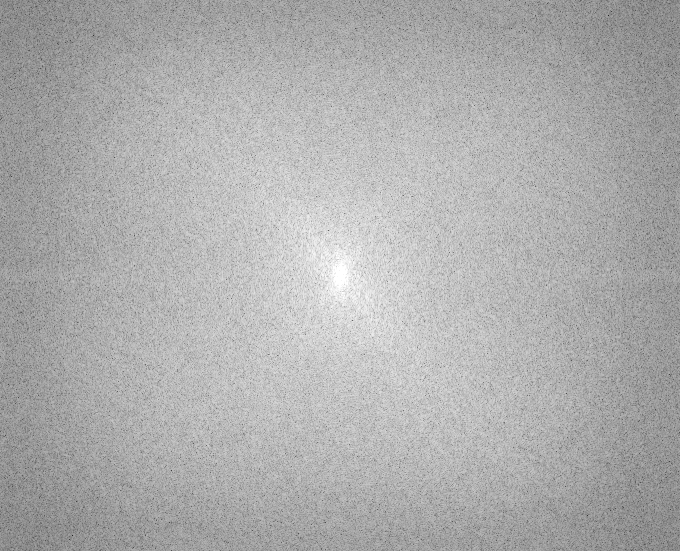

In [371]:
f = np.fft.fft2(triton_Red[:,:,2]);  # Find the 2D FFT of image
fshift = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshift)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Image: ');
cv2_imshow(magnitude_spectrum_R);

magnitude spectrum of Green Image: 


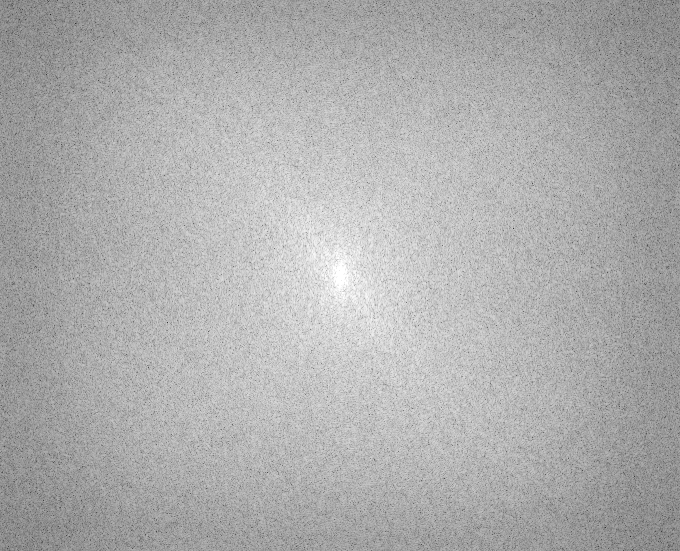

In [372]:
f = np.fft.fft2(triton[:,:,1]);  # Find the 2D FFT of image
fshift = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshift)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Image: ');
cv2_imshow(magnitude_spectrum_G);

magnitude spectrum of Blue Image: 


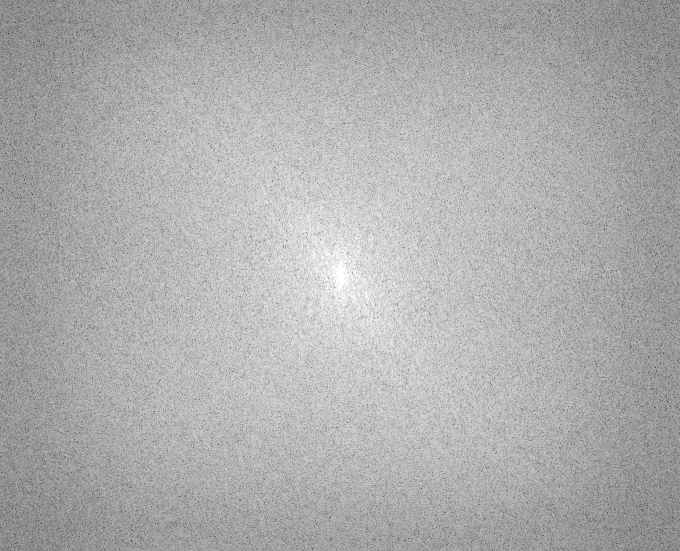

In [373]:
f = np.fft.fft2(triton[:,:,0]);  # Find the 2D FFT of image
fshift = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshift)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue Image: ');
cv2_imshow(magnitude_spectrum_B);

**Observations:**

1) We have visualized the magnitude spectrums of R G and B channels of original image.

2) Only the Red channel spectrum shows a very faint horizontal line which denotes the presence of vertical scan lines in the image.

3) These spectrums do not provide any concrete evidence that there are scan lines. So in the next step we will crop the image into two halfs horizontally and try to see if there is any horizontal scan line.

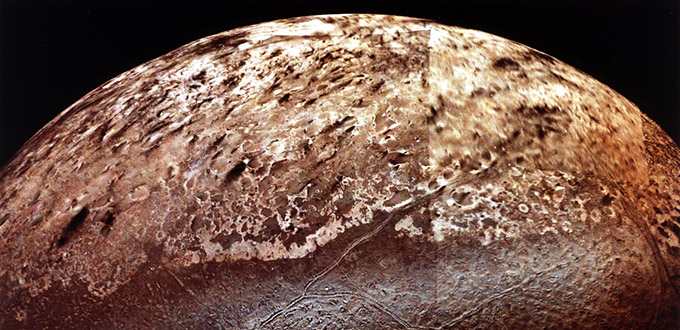

magnitude spectrum of Red Channel of half image: 


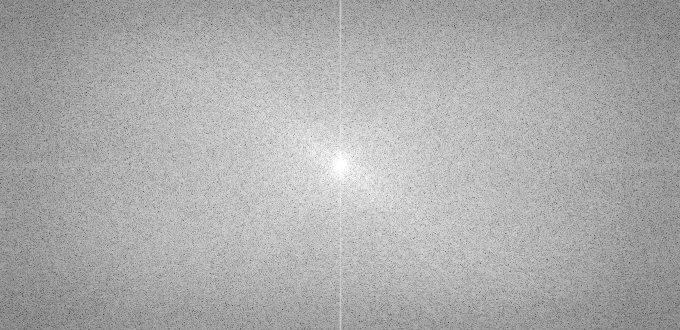

magnitude spectrum of Green Channel of half image: 


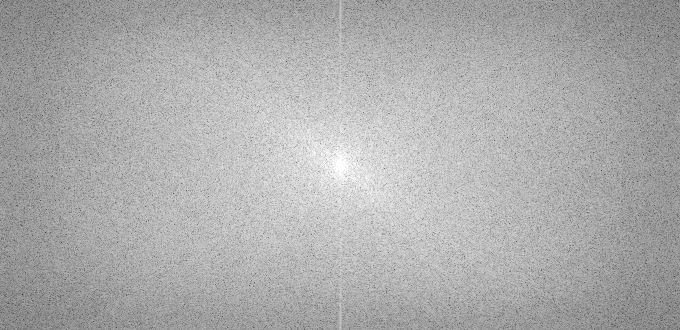

magnitude spectrum of Blue Channel of half image: 


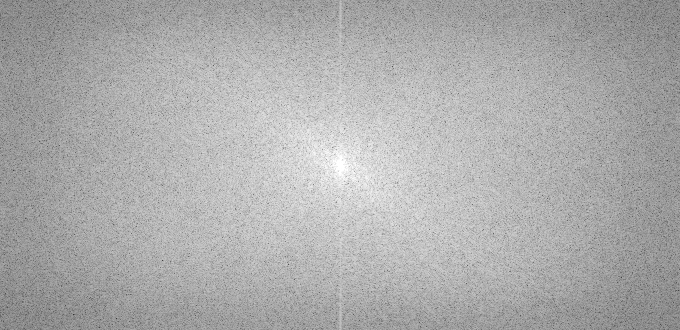

In [374]:
# Examining half image for scan lines
x,y,d = triton.shape
#halfTriton = triton[:,int(y/2):y-1,:];
#halfTriton = np.zeros(int(0.6*x),y,d);
halfTriton = triton[0:int(0.6*x),:,:];  # when I visualized the spectrum for half of the image I found out that a strong horizontal scan line is present in the image in each channel
cv2_imshow(halfTriton);

f = np.fft.fft2(halfTriton[:,:,2]);  # Find the 2D FFT of image
fshiftR = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshiftR)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Channel of half image: ');
cv2_imshow(magnitude_spectrum_R);

f = np.fft.fft2(halfTriton[:,:,1]);  # Find the 2D FFT of image
fshiftG = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshiftG)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Channel of half image: ');
cv2_imshow(magnitude_spectrum_G);

f = np.fft.fft2(halfTriton[:,:,0]);  # Find the 2D FFT of image
fshiftB = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshiftB)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue Channel of half image: ');
cv2_imshow(magnitude_spectrum_B);

**Observation:**

1) As it is evident from the above three magnitude spectra, each channel has a strong horizontal scan line present in it.

2) We will apply a vertical notch reject filter to all the three histograms and take the IFFT to obtain the filtered image.  

Modified Magnitude spectrum for Red Channel:


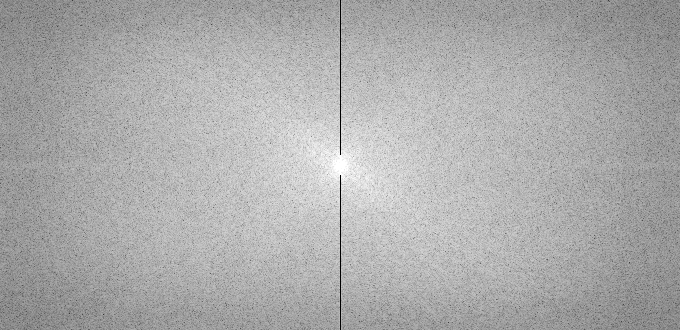

Modified Magnitude spectrum for Green Channel:


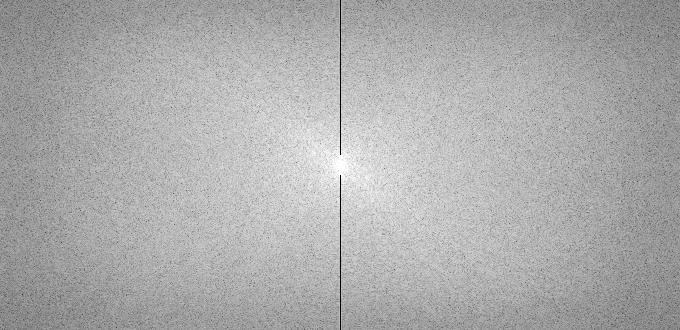

Modified Magnitude spectrum for Blue Channel:


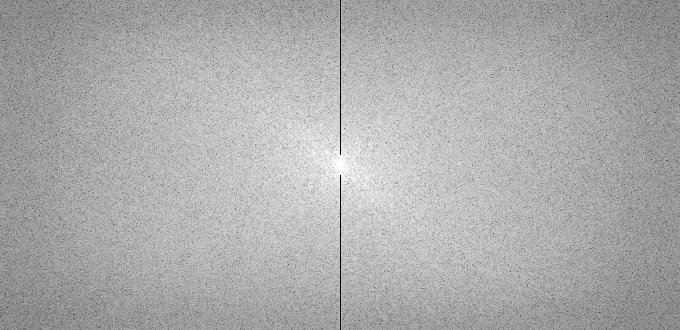

In [375]:
x,y = magnitude_spectrum_R[:,:].shape;
mask_R = np.ones(magnitude_spectrum_R[:,:].shape);
mask_R[0:int(x/2)-10,int(y/2)] = 0;
mask_R[int(x/2)+10:x,int(y/2)] = 0;
print("Modified Magnitude spectrum for Red Channel:");
cv2_imshow(mask_R*magnitude_spectrum_R);

mask_G = np.ones(magnitude_spectrum_G[:,:].shape);
mask_G[0:int(x/2)-10,int(y/2)] = 0;
mask_G[int(x/2)+10:x,int(y/2)] = 0;
print("Modified Magnitude spectrum for Green Channel:");
cv2_imshow(mask_G*magnitude_spectrum_G);

mask_B = np.ones(magnitude_spectrum_B[:,:].shape);
mask_B[0:int(x/2)-10,int(y/2)] = 0;
mask_B[int(x/2)+10:x,int(y/2)] = 0;
print("Modified Magnitude spectrum for Blue Channel:");
cv2_imshow(mask_B*magnitude_spectrum_B);

**Observations:**

1) We have created the modified magnitude spectrums for removing the horizontal scan lines present in the upper 60% portion of the Triton's image.

2) Now we will obtain the filtered image by applying the IDFT to the above spectrums.

Frequency filtered image (removing horizontal scan lines) of half Triton for Red Channel:


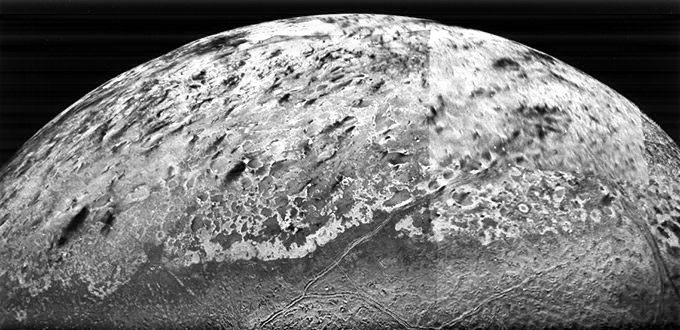

magnitude spectrum of Red Channel of filtered image: 


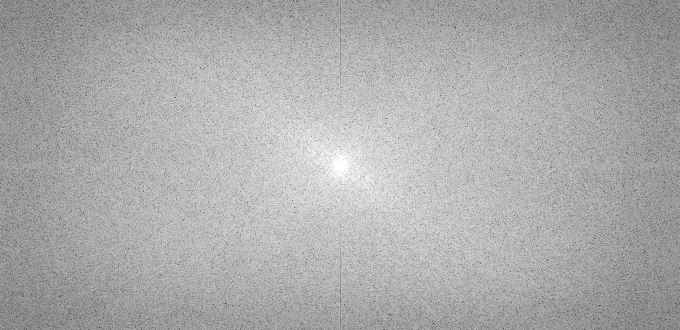

Frequency filtered image (removing horizontal scan lines) of half Triton for Green Channel:


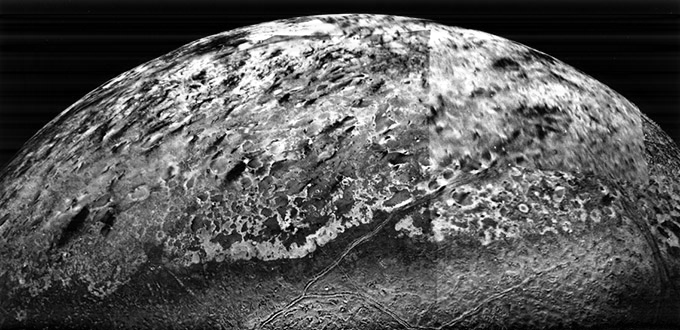

magnitude spectrum of Green Channel of filtered image: 


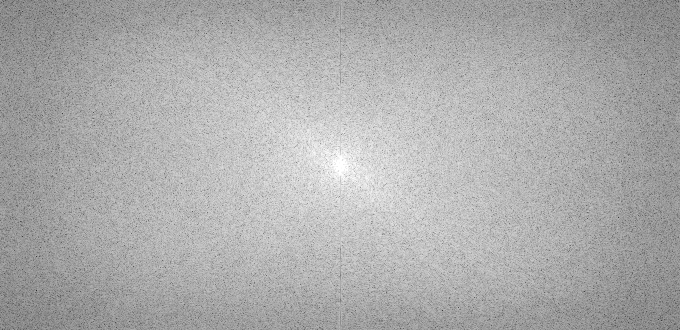

Frequency filtered image (removing horizontal scan lines) of half Triton for Blue Channel:


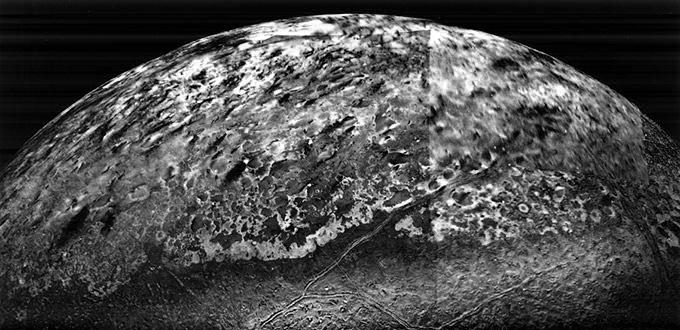

magnitude spectrum of Blue (removing horizontal scan lines) Channel of filtered image: 


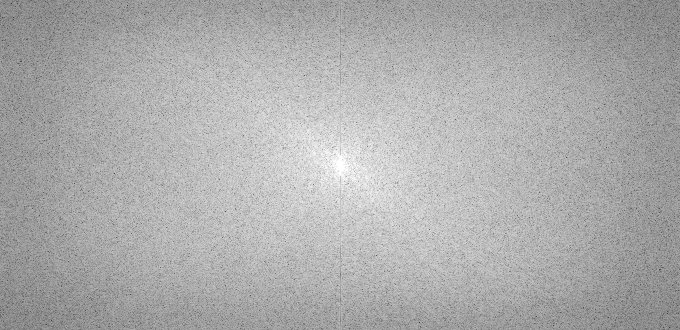

Reconstructed COLOR Image of Half Triton: 


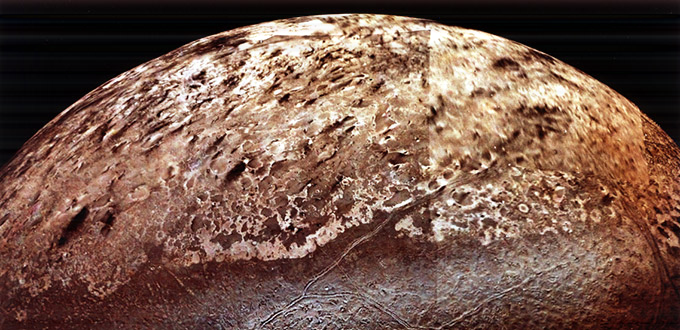

In [376]:
# For red channel apply idft
maskR_fft_shifted = np.fft.ifftshift(fshiftR*mask_R); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_R = np.abs(np.fft.ifft2(maskR_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing horizontal scan lines) of half Triton for Red Channel:");
cv2_imshow(Result_halfTriton_R);
f = np.fft.fft2(Result_halfTriton_R);  # Find the 2D FFT of image
fshiftR = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshiftR)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_R);


# For green channel apply idft
maskG_fft_shifted = np.fft.ifftshift(fshiftG*mask_G); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_G = np.abs(np.fft.ifft2(maskG_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing horizontal scan lines) of half Triton for Green Channel:");
cv2_imshow(Result_halfTriton_G);
f = np.fft.fft2(Result_halfTriton_G);  # Find the 2D FFT of image
fshiftG = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshiftG)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_G);


# For red channel apply idft
maskB_fft_shifted = np.fft.ifftshift(fshiftB*mask_B); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_B = np.abs(np.fft.ifft2(maskB_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing horizontal scan lines) of half Triton for Blue Channel:");
cv2_imshow(Result_halfTriton_B);
f = np.fft.fft2(Result_halfTriton_B);  # Find the 2D FFT of image
fshiftB = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshiftB)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue (removing horizontal scan lines) Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_B);


# Reconstruct the color image by placing each filtered output at appropriqate channel position
print("Reconstructed COLOR Image of Half Triton: ");
x_t,y_t,w_t = halfTriton.shape;
corrected_Hori_HalfTriton = np.zeros(halfTriton.shape);
corrected_Hori_HalfTriton[:,:,0] = Result_halfTriton_B;
corrected_Hori_HalfTriton[:,:,1] = Result_halfTriton_G;
corrected_Hori_HalfTriton[:,:,2] = Result_halfTriton_R;
corrected_Hori_HalfTriton[x_t-6:x_t,:,:] = halfTriton[x_t-6:x_t,:,:]; # Due to frequency domain filtering some pixels at the bottom of the image become black
# Due to this the complete image of Triton has a black horizontal line approx 6 pixels wide
# So to remove this effect we replace the bottom six rows of this filtered image with six rows from original image.
cv2_imshow(corrected_Hori_HalfTriton);

**Observations:**

1) We have successfully removed the horizontal scan lines present in the Triton's image.

2) This is prooved from the magnitude spectrum of Triton's Half image above for each channel. In the new magnitude spectrum vertical lines are absent which denotes that horizontal scan lines have been eliminated.

3) Now we will combine our result with original full image of Triton and apply similar method to remove vertical scan lines. 

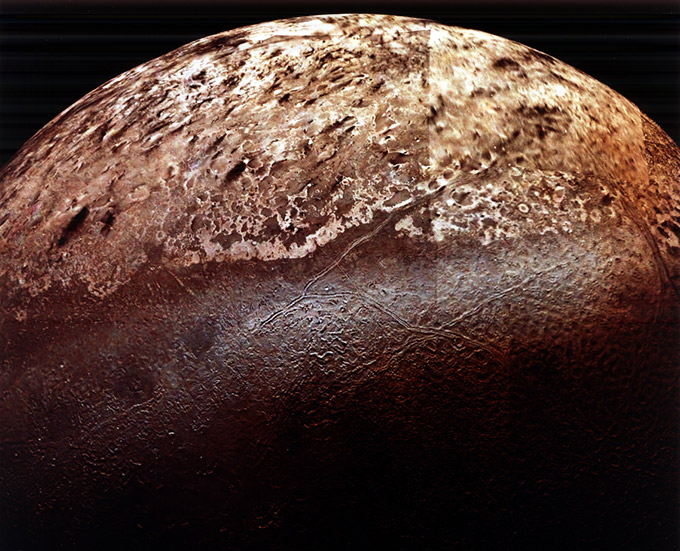

In [377]:
x,y,c = corrected_Hori_HalfTriton.shape;
correctedTritonFull = np.zeros(triton.shape);
correctedTritonFull[0:x,:,:] = corrected_Hori_HalfTriton[:,:,:];
x_t,y_t,c_t = triton.shape
correctedTritonFull[x:x_t,:,:] = triton[x:x_t,:,:];
cv2_imshow(correctedTritonFull);

**Examine the vertical half images for vertical scan lines:**

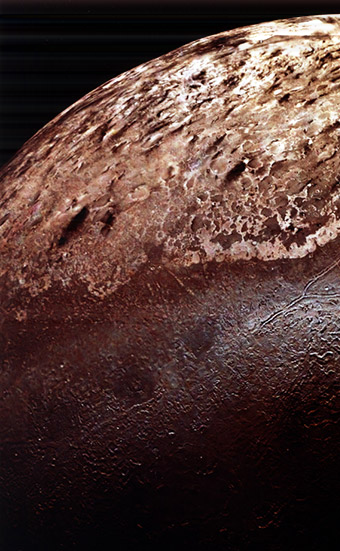

magnitude spectrum of Red Channel of half image: 


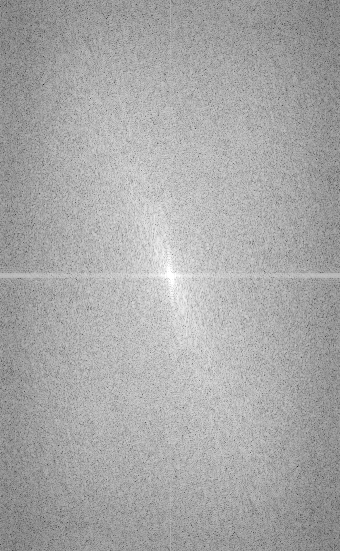

magnitude spectrum of Green Channel of half image: 


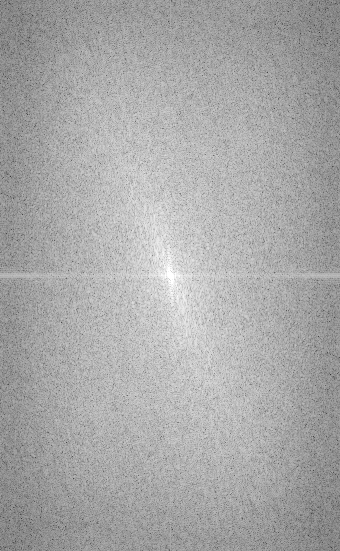

magnitude spectrum of Blue Channel of half image: 


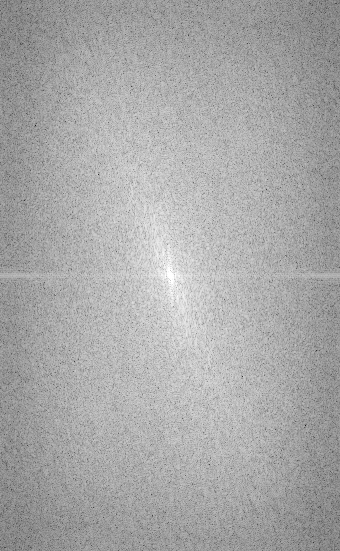

In [378]:
# Examining vertical halfs image for scan lines
x,y,d = triton.shape
halfTriton = correctedTritonFull[:,0:int(y/2),:];  # when I visualized the spectrum for half of the image I found out that a strong horizontal scan line is present in the image in each channel
cv2_imshow(halfTriton);

f = np.fft.fft2(halfTriton[:,:,2]);  # Find the 2D FFT of image
fshiftR = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshiftR)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Channel of half image: ');
cv2_imshow(magnitude_spectrum_R);

f = np.fft.fft2(halfTriton[:,:,1]);  # Find the 2D FFT of image
fshiftG = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshiftG)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Channel of half image: ');
cv2_imshow(magnitude_spectrum_G);

f = np.fft.fft2(halfTriton[:,:,0]);  # Find the 2D FFT of image
fshiftB = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshiftB)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue Channel of half image: ');
cv2_imshow(magnitude_spectrum_B);

**Observation:**

1) It is clear that both the left and right vertical halves of the image has vertical scan lines present in it (we have already removed horizontal scan lines in earlier part of program).

2) We will first filtr out the first half in frequency domain and then we will filter out the second half in frequency domain in a similar way.

3) Also I observed that if we take magnitude spectrum of entire image then these horizontal and vertical lines corresponding to scan lines is absent in the spectrum. So dividing the image into two halves is necessary.


Modified Magnitude spectrum for Red Channel:


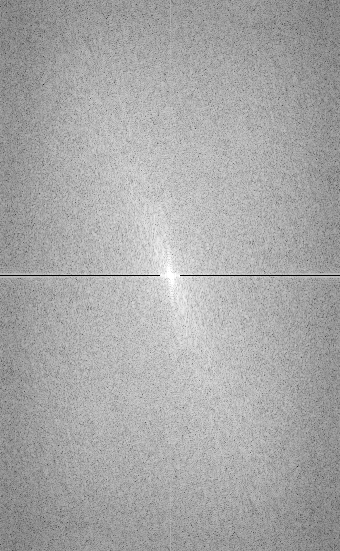

Modified Magnitude spectrum for Green Channel:


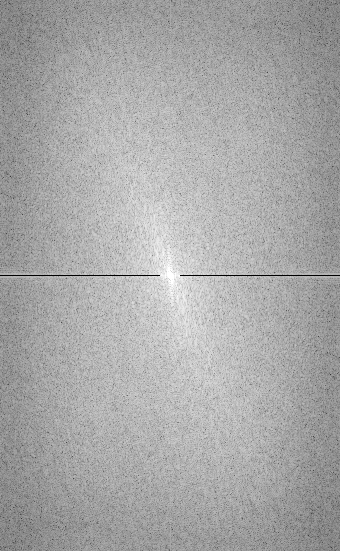

Modified Magnitude spectrum for Blue Channel:


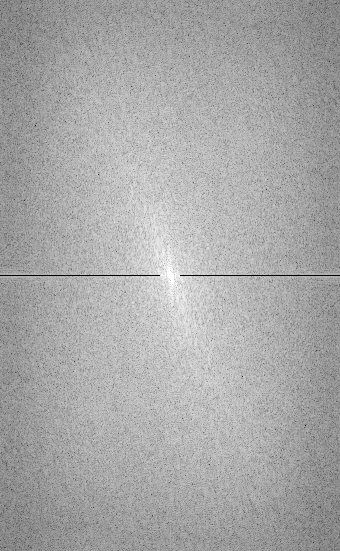

In [379]:
# APPLY FREQUENCY DOMAIN FILTERING ON LEFT VERTICAL HALF OF IMAGE
x,y = magnitude_spectrum_R[:,:].shape;
mask_R = np.ones(magnitude_spectrum_R[:,:].shape);
mask_R[int(x/2),0:int(y/2)-10] = 0;
#mask_R[int(x/2)+1,0:int(y/2)-10] = 0;
mask_R[int(x/2),int(y/2)+10:y] = 0;
#mask_R[int(x/2)+1,int(y/2)+10:y] = 0;
print("Modified Magnitude spectrum for Red Channel:");
cv2_imshow(mask_R*magnitude_spectrum_R);

mask_G = np.ones(magnitude_spectrum_G[:,:].shape);
mask_G[int(x/2),0:int(y/2)-10] = 0;
#mask_G[int(x/2)+1,0:int(y/2)-10] = 0;
mask_G[int(x/2),int(y/2)+10:y] = 0;
#mask_G[int(x/2)+1,int(y/2)+10:y] = 0;
print("Modified Magnitude spectrum for Green Channel:");
cv2_imshow(mask_G*magnitude_spectrum_G);

mask_B = np.ones(magnitude_spectrum_B[:,:].shape);
mask_B[int(x/2),0:int(y/2)-10] = 0;
#mask_B[int(x/2)+1,0:int(y/2)-10] = 0;
mask_B[int(x/2),int(y/2)+10:y] = 0;
#mask_B[int(x/2)+1,int(y/2)+10:y] = 0;
print("Modified Magnitude spectrum for Blue Channel:");
cv2_imshow(mask_B*magnitude_spectrum_B);

**Observations:**

1) Here I have formed the frequency domain filters to suppress the vertical scan lines present in the image from which horizontal scan lines were removed.

2) In next step we apply IDFT and find out the spatial domain filtered image.

Frequency filtered image (removing vertical scan lines) of half Triton for Red Channel:


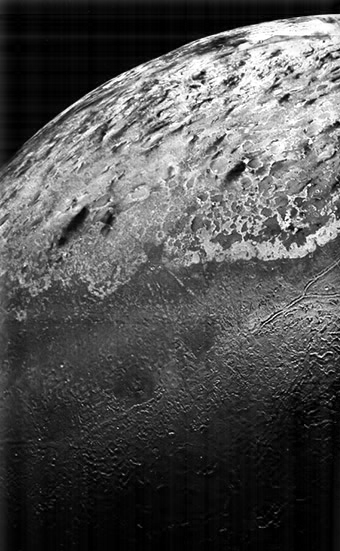

magnitude spectrum of Red Channel of filtered image: 


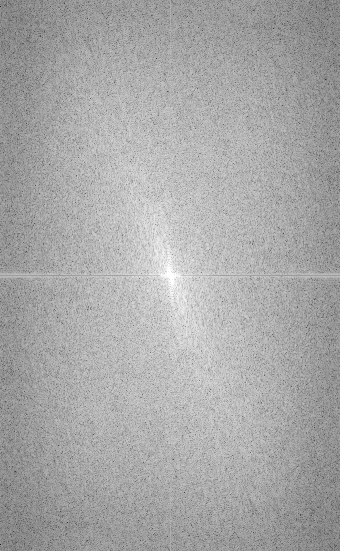

Frequency filtered image (removing vertical scan lines) of half Triton for Green Channel:


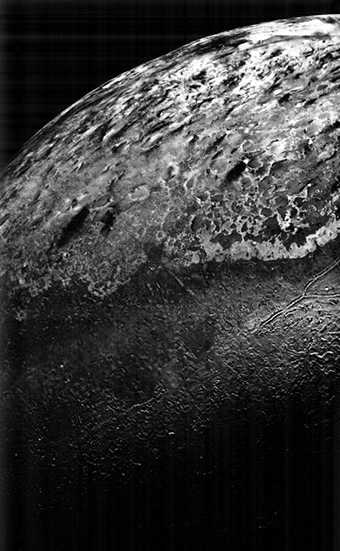

magnitude spectrum of Green Channel of filtered image: 


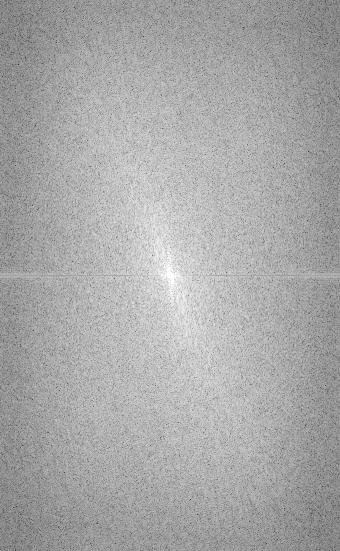

Frequency filtered image (removing vertical scan lines) of half Triton for Blue Channel:


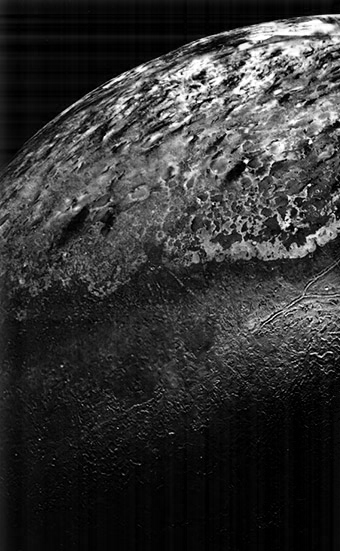

magnitude spectrum of Blue Channel of filtered image: 


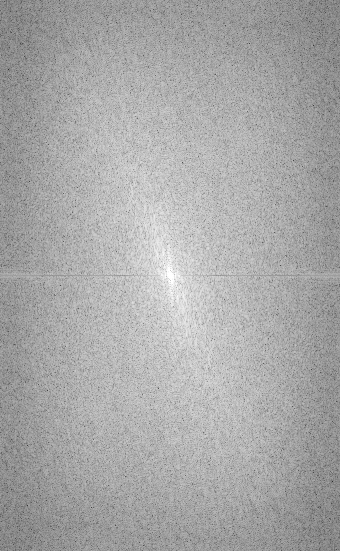

Reconstructed COLOR Image of Half Triton: 


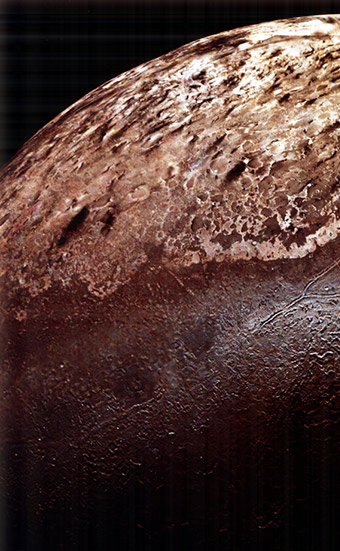

In [380]:
# For red channel apply idft
maskR_fft_shifted = np.fft.ifftshift(fshiftR*mask_R); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_R = np.abs(np.fft.ifft2(maskR_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing vertical scan lines) of half Triton for Red Channel:");
cv2_imshow(Result_halfTriton_R);
f = np.fft.fft2(Result_halfTriton_R);  # Find the 2D FFT of image
fshiftR = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshiftR)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_R);


# For green channel apply idft
maskG_fft_shifted = np.fft.ifftshift(fshiftG*mask_G); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_G = np.abs(np.fft.ifft2(maskG_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing vertical scan lines) of half Triton for Green Channel:");
cv2_imshow(Result_halfTriton_G);
f = np.fft.fft2(Result_halfTriton_G);  # Find the 2D FFT of image
fshiftG = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshiftG)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_G);


# For red channel apply idft
maskB_fft_shifted = np.fft.ifftshift(fshiftB*mask_B); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_B = np.abs(np.fft.ifft2(maskB_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing vertical scan lines) of half Triton for Blue Channel:");
cv2_imshow(Result_halfTriton_B);
f = np.fft.fft2(Result_halfTriton_B);  # Find the 2D FFT of image
fshiftB = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshiftB)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_B);


# Reconstruct the color image by placing each filtered output at appropriqate channel position
print("Reconstructed COLOR Image of Half Triton: ");
x_t,y_t,w_t = halfTriton.shape;
corrected_Vert_HalfTriton = np.zeros(halfTriton.shape);
corrected_Vert_HalfTriton[:,:,0] = Result_halfTriton_B;
corrected_Vert_HalfTriton[:,:,1] = Result_halfTriton_G;
corrected_Vert_HalfTriton[:,:,2] = Result_halfTriton_R;
corrected_Vert_HalfTriton[:,y_t-6:y_t:,:] = halfTriton[:,y_t-6:y_t,:]; # Due to frequency domain filtering some pixels at the bottom of the image become black
# Due to this the complete image of Triton has a black horizontal line approx 6 pixels wide
# So to remove this effect we replace the bottom six rows of this filtered image with six rows from original image.
cv2_imshow(corrected_Vert_HalfTriton);

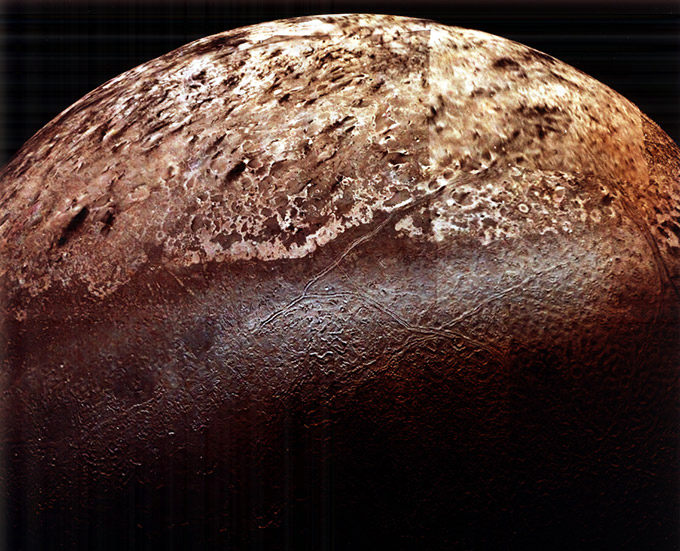

In [381]:
x,y,c = corrected_Vert_HalfTriton.shape;
correctedTritonFull2 = np.zeros(triton.shape);
correctedTritonFull2[:,0:y,:] = corrected_Vert_HalfTriton[:,:,:];
x_t,y_t,c_t = triton.shape
correctedTritonFull2[:,y:y_t,:] = correctedTritonFull[:,y:y_t,:];
cv2_imshow(correctedTritonFull2);

**Observations:**

1) The above image of Triton has removed horizontal edges and vertical edges have also been removed from first vertical half of the image.

2) Now we will apply frequency domain filtering to the second vertical half of the Triton image in the next section.

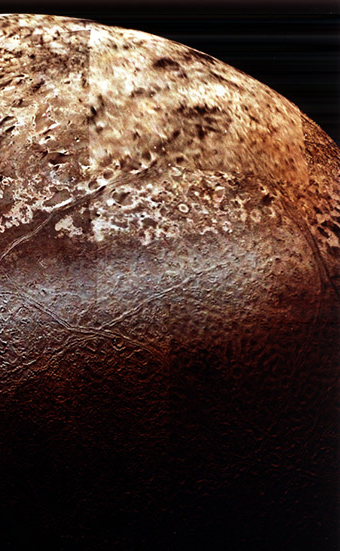

magnitude spectrum of Red Channel of half image: 


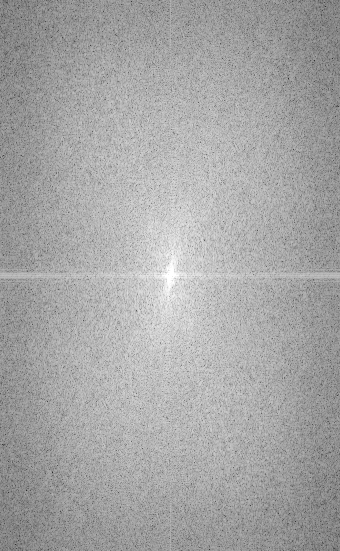

magnitude spectrum of Green Channel of half image: 


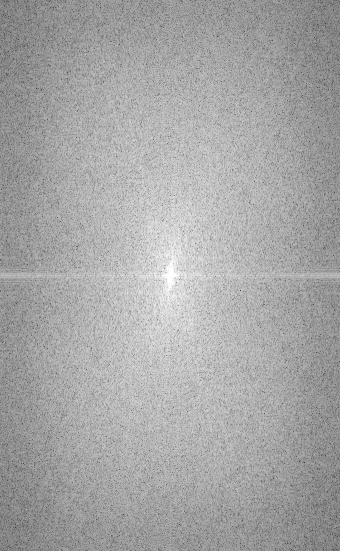

magnitude spectrum of Blue Channel of half image: 


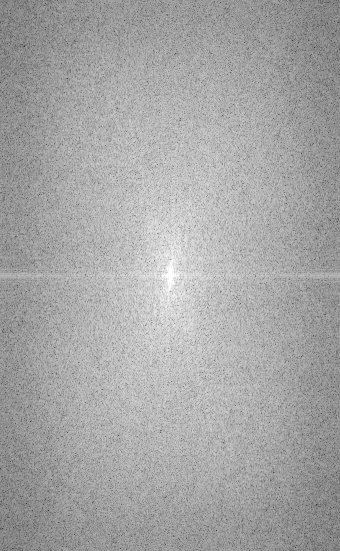

In [386]:
# Examining vertical half image for scan lines
x,y,d = triton.shape
halfTriton = correctedTritonFull2[:,int(y/2):y,:];  # when I visualized the spectrum for half of the image I found out that a strong horizontal scan line is present in the image in each channel
cv2_imshow(halfTriton);

f = np.fft.fft2(halfTriton[:,:,2]);  # Find the 2D FFT of image
fshiftR = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshiftR)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Channel of half image: ');
cv2_imshow(magnitude_spectrum_R);

f = np.fft.fft2(halfTriton[:,:,1]);  # Find the 2D FFT of image
fshiftG = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshiftG)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Channel of half image: ');
cv2_imshow(magnitude_spectrum_G);

f = np.fft.fft2(halfTriton[:,:,0]);  # Find the 2D FFT of image
fshiftB = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshiftB)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue Channel of half image: ');
cv2_imshow(magnitude_spectrum_B);

Modified Magnitude spectrum for Red Channel:


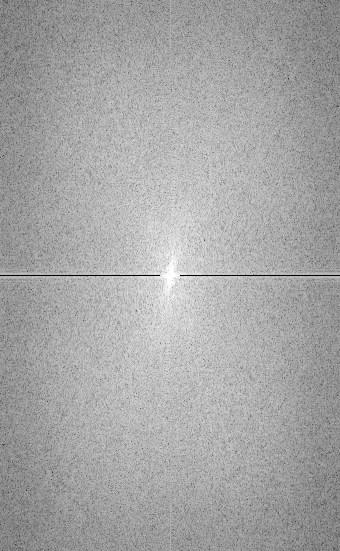

Modified Magnitude spectrum for Green Channel:


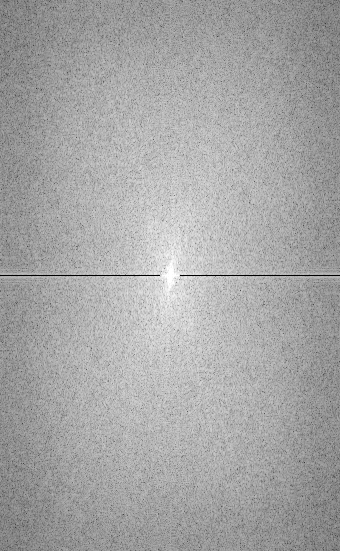

Modified Magnitude spectrum for Blue Channel:


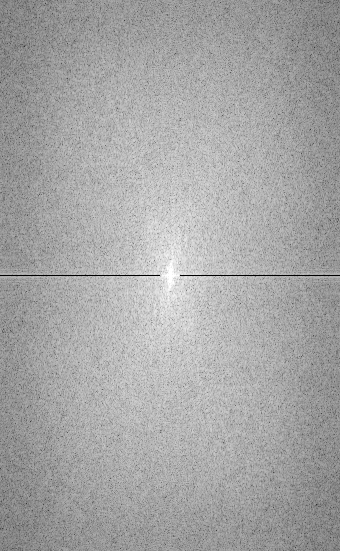

In [387]:
# APPLY FREQUENCY DOMAIN FILTERING ON RIGHT VERTICAL HALF OF IMAGE
x,y = magnitude_spectrum_R[:,:].shape;
mask_R = np.ones(magnitude_spectrum_R[:,:].shape);
mask_R[int(x/2),0:int(y/2)-10] = 0;
mask_R[int(x/2),int(y/2)+10:y] = 0;
#mask_R[int(x/2)+1,int(y/2)+10:y] = 0;
print("Modified Magnitude spectrum for Red Channel:");
cv2_imshow(mask_R*magnitude_spectrum_R);

mask_G = np.ones(magnitude_spectrum_G[:,:].shape);
mask_G[int(x/2),0:int(y/2)-10] = 0;
#mask_G[int(x/2)+1,0:int(y/2)-10] = 0;
mask_G[int(x/2),int(y/2)+10:y] = 0;
#mask_G[int(x/2)+1,int(y/2)+10:y] = 0;
print("Modified Magnitude spectrum for Green Channel:");
cv2_imshow(mask_G*magnitude_spectrum_G);

mask_B = np.ones(magnitude_spectrum_B[:,:].shape);
mask_B[int(x/2),0:int(y/2)-10] = 0;
#mask_B[int(x/2)+1,0:int(y/2)-10] = 0;
mask_B[int(x/2),int(y/2)+10:y] = 0;
#mask_B[int(x/2)+1,int(y/2)+10:y] = 0;
print("Modified Magnitude spectrum for Blue Channel:");
cv2_imshow(mask_B*magnitude_spectrum_B);

Frequency filtered image (removing vertical scan lines) of half Triton for Red Channel:


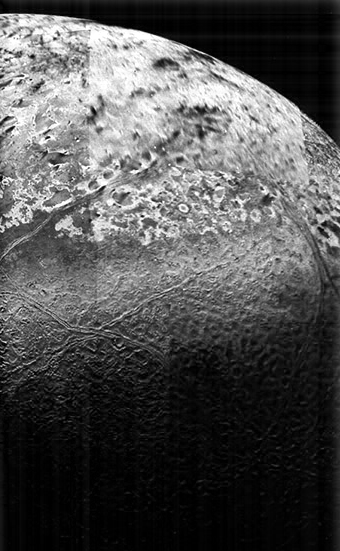

magnitude spectrum of Red Channel of filtered image: 


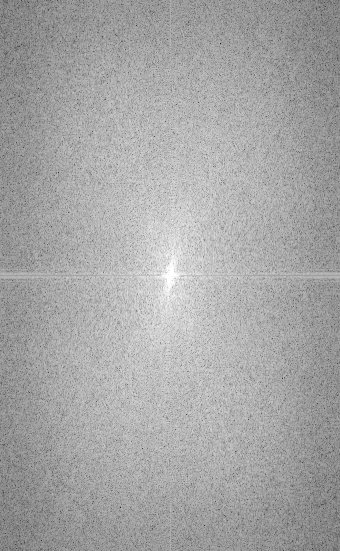

Frequency filtered image (removing vertical scan lines) of half Triton for Green Channel:


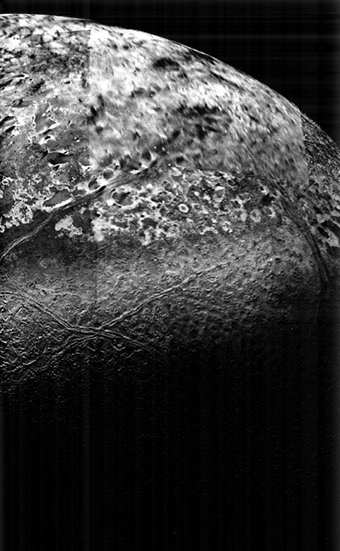

magnitude spectrum of Green Channel of filtered image: 


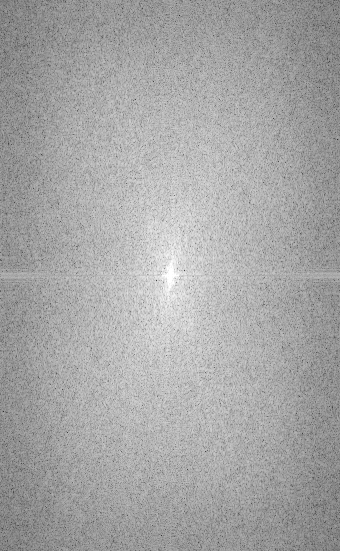

Frequency filtered image (removing vertical scan lines) of half Triton for Blue Channel:


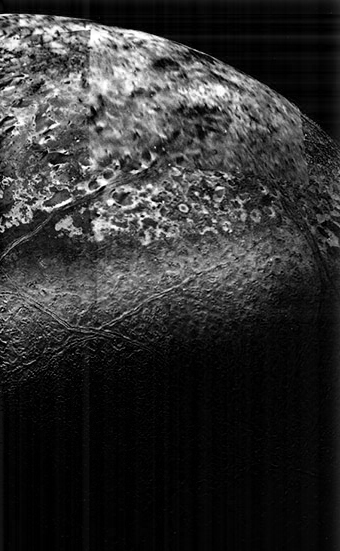

magnitude spectrum of Blue Channel of filtered image: 


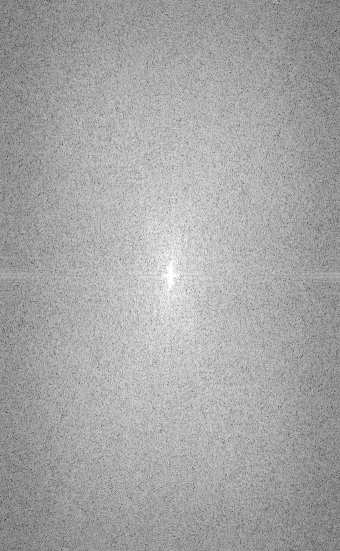

Reconstructed COLOR Image of Half Triton: 


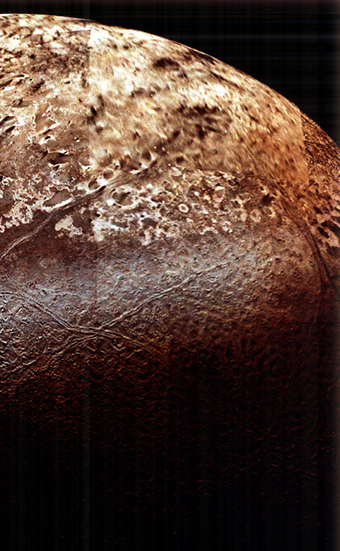

In [388]:
# For red channel apply idft
maskR_fft_shifted = np.fft.ifftshift(fshiftR*mask_R); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_R = np.abs(np.fft.ifft2(maskR_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing vertical scan lines) of half Triton for Red Channel:");
cv2_imshow(Result_halfTriton_R);
f = np.fft.fft2(Result_halfTriton_R);  # Find the 2D FFT of image
fshiftR = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_R = 20*np.log(np.abs(fshiftR)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Red Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_R);


# For green channel apply idft
maskG_fft_shifted = np.fft.ifftshift(fshiftG*mask_G); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_G = np.abs(np.fft.ifft2(maskG_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing vertical scan lines) of half Triton for Green Channel:");
cv2_imshow(Result_halfTriton_G);
f = np.fft.fft2(Result_halfTriton_G);  # Find the 2D FFT of image
fshiftG = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_G = 20*np.log(np.abs(fshiftG)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Green Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_G);


# For red channel apply idft
maskB_fft_shifted = np.fft.ifftshift(fshiftB*mask_B); # The inverse of fftshift. Although identical for even-length x, the functions differ by one sample for odd-length x.
Result_halfTriton_B = np.abs(np.fft.ifft2(maskB_fft_shifted));  # Compute the inverse DFT of the result
print("Frequency filtered image (removing vertical scan lines) of half Triton for Blue Channel:");
cv2_imshow(Result_halfTriton_B);
f = np.fft.fft2(Result_halfTriton_B);  # Find the 2D FFT of image
fshiftB = np.fft.fftshift(f); # Shift the zero-frequency component to the center of the spectrum.
magnitude_spectrum_B = 20*np.log(np.abs(fshiftB)); # Take log of magnitude spectrum for proper visulaization as dynamic range of Fourier Coefficients is very large 
print('magnitude spectrum of Blue Channel of filtered image: ');
cv2_imshow(magnitude_spectrum_B);


# Reconstruct the color image by placing each filtered output at appropriqate channel position
print("Reconstructed COLOR Image of Half Triton: ");
x_t,y_t,w_t = halfTriton.shape;
corrected_Vert_HalfTriton = np.zeros(halfTriton.shape);
corrected_Vert_HalfTriton[:,:,0] = Result_halfTriton_B;
corrected_Vert_HalfTriton[:,:,1] = Result_halfTriton_G;
corrected_Vert_HalfTriton[:,:,2] = Result_halfTriton_R;
corrected_Vert_HalfTriton[:,0:6,:] = halfTriton[:,0:6,:]; # Due to frequency domain filtering some pixels at the bottom of the image become black
# Due to this the complete image of Triton has a black horizontal line approx 6 pixels wide
# So to remove this effect we replace the bottom six rows of this filtered image with six rows from original image.
cv2_imshow(corrected_Vert_HalfTriton);

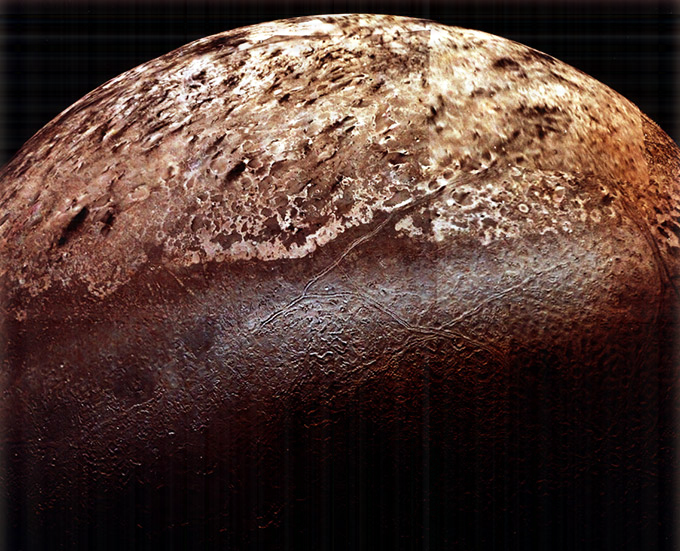

In [389]:
x,y,c = corrected_Vert_HalfTriton.shape;
correctedTritonFull3 = np.zeros(triton.shape);
x_t,y_t,c_t = triton.shape
correctedTritonFull3[:,int(y_t/2):y_t,:] = corrected_Vert_HalfTriton[:,:,:];
correctedTritonFull3[:,0:int(y_t/2),:] = correctedTritonFull2[:,0:int(y_t/2),:];
cv2_imshow(correctedTritonFull3);

**Observations:**

1) We have removed the vertical and horizontal scan lines successfully from the Triton's image.

2) The spectrum obtained after removal of vertical scan lines contains some faint horizontal lines at the right and left extremes of the spectrum.

3) The frequency domain filtered image is shown above.